In [1]:
# import cv2
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.patches as patches
%matplotlib inline
import numpy as np
from PIL import Image


# import imageio as iio
# import visvis as vv

# im = iio.imread('http://upload.wikimedia.org/wikipedia/commons/d/de/Wikipedia_Logo_1.0.png')
# vv.imshow(im)

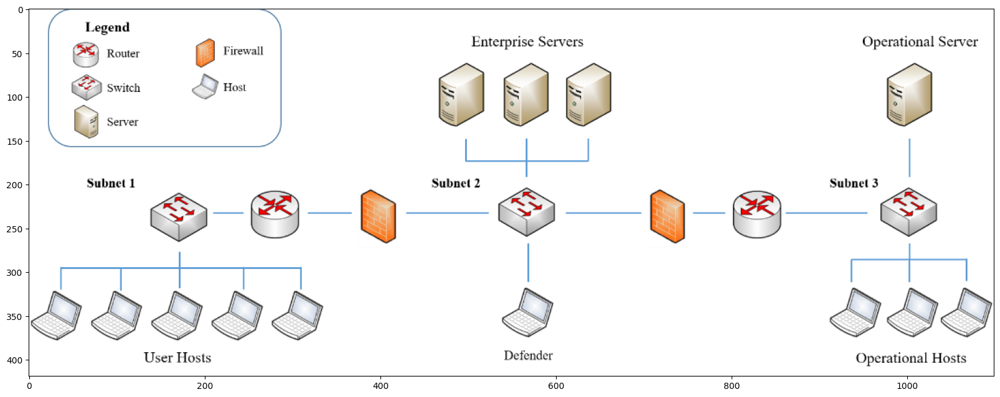

In [2]:
fig, ax = plt.subplots(figsize=(20, 8))
img = mpl.image.imread("./img/figure1.png")
plt.imshow(img)

In [3]:
# fig, ax = plt.subplots(figsize=(20, 8))
# cv2.rectangle(img, pt1=(400,20), pt2=(500,120), 
#               color=(255,0,0), thickness=6)
# plt.imshow(img)

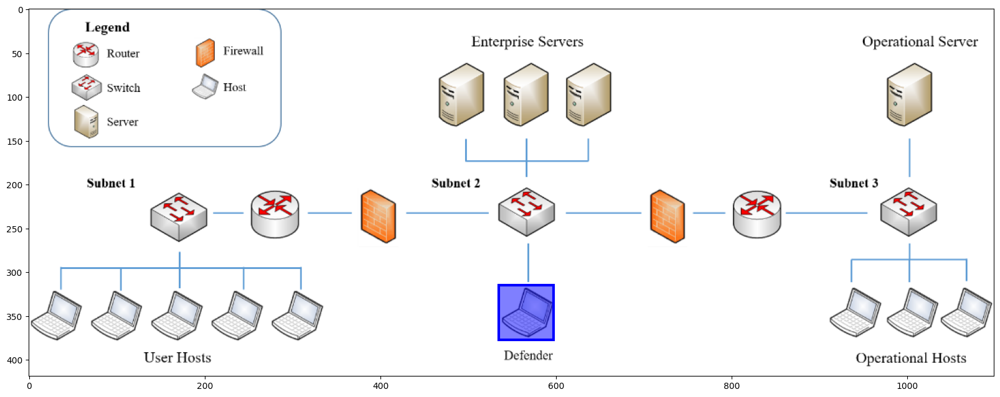

In [3]:
im = Image.open('./img/figure1.png')

# Create figure and axes
fig, ax = plt.subplots(figsize=(20, 8))

# Display the image
ax.imshow(im)

known_shade = (1,0,0,0.5) # facecolor
unknown_shade = (0,0,1,0.5) # facecolor
access_none = 'b' # edgecolor
access_user = 'y' # edgecolor
access_priv = 'r' # edgecolor
e0_loc = (460, 55)
e1_loc = (532, 55)
e2_loc = (603, 55)
ops_loc = (968, 55)
op_host0_loc = (908, 315)
op_host1_loc = (973, 315)
op_host2_loc = (1035, 315)
user0_loc = (0, 317)
user1_loc = (67, 317)
user2_loc = (135, 317)
user3_loc = (204, 317)
user4_loc = (273, 317)
defender_loc = (535, 315)
server_shape_w = 65
server_shape_h = 85
host_shape_w = 62
host_shape_h = 62


# Create a Rectangle patch
rect = patches.Rectangle(defender_loc, host_shape_w, host_shape_h, linewidth=3, 
                         edgecolor=access_none, facecolor=unknown_shade)

# Add the patch to the Axes
ax.add_patch(rect)

plt.show()

In [4]:
known_shade = (1,0,0,0.5) # facecolor
unknown_shade = (0,0,1,0.5) # facecolor
access_none = 'b' # edgecolor
access_user = 'y' # edgecolor
access_priv = 'r' # edgecolor
# e0_loc = (460, 55)
# e1_loc = (532, 55)
# e2_loc = (603, 55)
# ops_loc = (968, 55)
# op_host0_loc = (908, 315)
# op_host1_loc = (973, 315)
# op_host2_loc = (1035, 315)
# user0_loc = (0, 317)
# user1_loc = (67, 317)
# user2_loc = (135, 317)
# user3_loc = (204, 317)
# user4_loc = (273, 317)
# defender_loc = (535, 315)
server_shape_w = 65
server_shape_h = 85
host_shape_w = 62
host_shape_h = 62

def get_loc(hostname):
    if hostname == "Enterprise0":
        loc = (460, 55)
    elif hostname == "Enterprise1":
        loc = (532, 55)
    elif hostname == "Enterprise2":
        loc = (603, 55)
    elif hostname == "Op_Server0":
        loc = (968, 55)
    elif hostname == "Op_Host0":
        loc = (908, 315)
    elif hostname == "Op_Host1":
        loc = (973, 315)
    elif hostname == "Op_Host2":
        loc = (1035, 315)
    elif hostname == "User0":
        loc = (0, 317)
    elif hostname == "User1":
        loc = (67, 317)
    elif hostname == "User2":
        loc = (135, 317)
    elif hostname == "User3":
        loc = (204, 317)
    elif hostname == "User4":
        loc = (273, 317)
    elif hostname == "Defender":
        loc = (535, 315) 
    return loc

def add_patch(hostname, known_state, access_state, scanned=False):
    # Translate variables to colors
    if known_state:
        facecolor_shade = known_shade
    else:
        facecolor_shade = unknown_shade
    if access_state == "None":
        edgecolor_shade = access_none
    elif access_state == "User":
        edgecolor_shade = access_user
    else: # access_state == "Privileged"
        edgecolor_shade = access_priv
        
    if "Enterprise" in hostname or "Server" in hostname:
        shape_w = server_shape_w
        shape_h = server_shape_h
    else: # Host
        shape_w = host_shape_w
        shape_h = host_shape_h
    loc = get_loc(hostname)
    
    # Create a Rectangle patch
    rect = patches.Rectangle(loc, shape_w, shape_h, linewidth=3, 
                             edgecolor=edgecolor_shade, facecolor=facecolor_shade)
    # Add the patch to the Axes
    ax.add_patch(rect)

# Parse Results Files

In [5]:
from results_parser import parse_results

file_name = "logs_to_vis/results.txt"# "logs_to_vis/checkpoint-1000-results.txt" #"logs_to_vis/results.txt"
results_json = parse_results(file_name)

In [8]:
len(results_json)

0

In [19]:
# with open(file_name, 'r') as fp:
#     lines = fp.readlines()
# lines[1]

# dest_file_name = ""
# results_json = []
# step = {"hosts":[]}
# header = False
# for i in range(len(lines)):
#     l = lines[i]
#     if "Blue Action: " in l:
#         step["blue_action"] = l.lstrip('Blue Action: ').strip()
# #         print(f"\'{blue_action}\'")
#     elif "Reward: " in l:
#         rewards = l.split(",")
#         step["reward"] = rewards[0].lstrip("Reward: ")
#         step["ep_reward"] = rewards[1].strip().lstrip("Episode reward: ")
# #         print(f"parsed: {reward} and {ep_reward}")
#     elif "+" in l:
#         if "Subnet" in lines[i+1]:
#             header = True
#         else: # Header started so this is end of header
#             header = False
#     elif not header and "|" in l:
#         row = l.split("|")
#         attr = {} # attributes listed by hostname
#         attr["subnet"] = row[1].strip()
#         attr["ip_addr"] = row[2].strip()
#         attr["known"] = "True" in row[4].strip()
# #         print("True" in attr["known"])
#         attr["scanned"] = "True" in row[5].strip()
#         attr["access"] = row[6].strip()
#         attr["hostname"] = row[3].strip()
#         step["hosts"].append(attr)
# #         print(f"{hostname} ({ip_addr} with subnet {subnet}) is known ({known}), scanned ({scanned}), and access ({access})")
# #         print(row)
#     elif "------------------------------------------" in l and not step == {"hosts":[]}:
#         results_json.append(step)
#         step = {"hosts":[]}
#     else:
#         continue

# if dest_file_name == "":
#     dest_file_name = file_name.rstrip(".txt") + ".json"
# with open(dest_file_name, 'w') as fp:
#     fp.write(str(results_json))


In [20]:
results_json

[{'hosts': [{'subnet': '10.0.22.160/28',
    'ip_addr': '10.0.22.169',
    'known': False,
    'scanned': False,
    'access': 'None',
    'hostname': 'Defender'},
   {'subnet': '10.0.22.160/28',
    'ip_addr': '10.0.22.161',
    'known': False,
    'scanned': False,
    'access': 'None',
    'hostname': 'Enterprise0'},
   {'subnet': '10.0.22.160/28',
    'ip_addr': '10.0.22.172',
    'known': False,
    'scanned': False,
    'access': 'None',
    'hostname': 'Enterprise1'},
   {'subnet': '10.0.22.160/28',
    'ip_addr': '10.0.22.165',
    'known': False,
    'scanned': False,
    'access': 'None',
    'hostname': 'Enterprise2'},
   {'subnet': '10.0.114.128/28',
    'ip_addr': '10.0.114.139',
    'known': False,
    'scanned': False,
    'access': 'None',
    'hostname': 'Op_Host0'},
   {'subnet': '10.0.114.128/28',
    'ip_addr': '10.0.114.140',
    'known': False,
    'scanned': False,
    'access': 'None',
    'hostname': 'Op_Host1'},
   {'subnet': '10.0.114.128/28',
    'ip_addr': 

# Visualise Results

In [21]:
# img = results_json[0]
# img

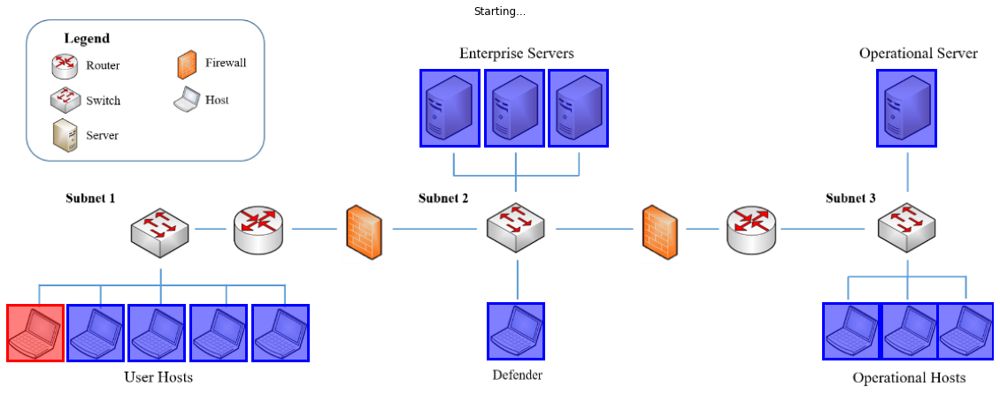

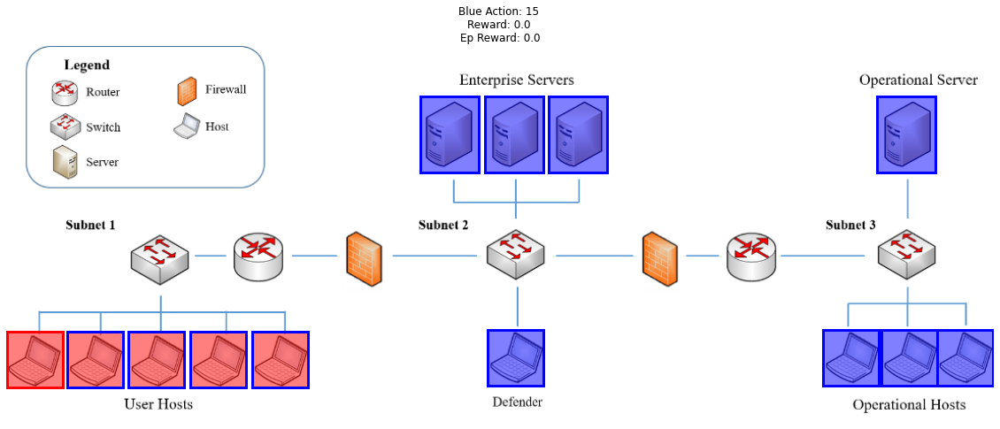

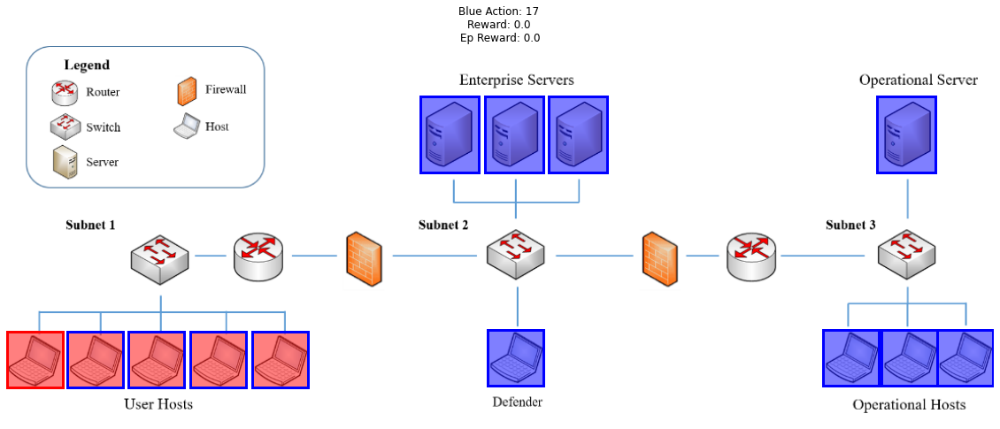

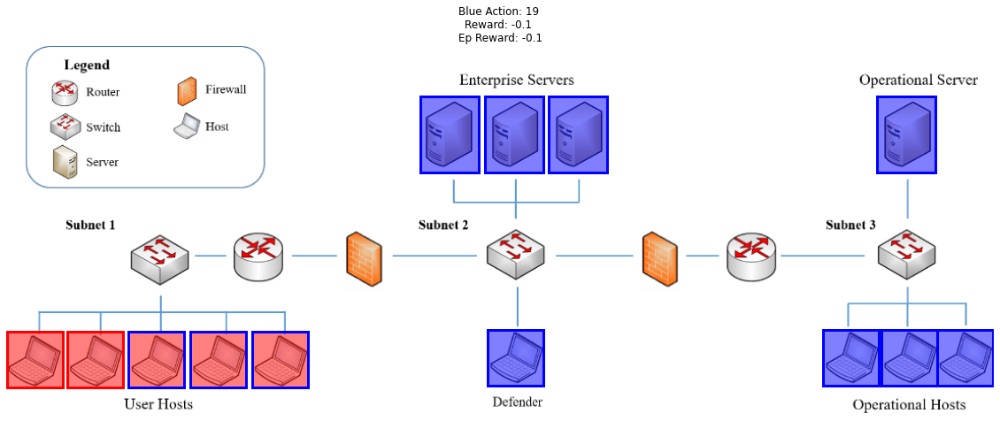

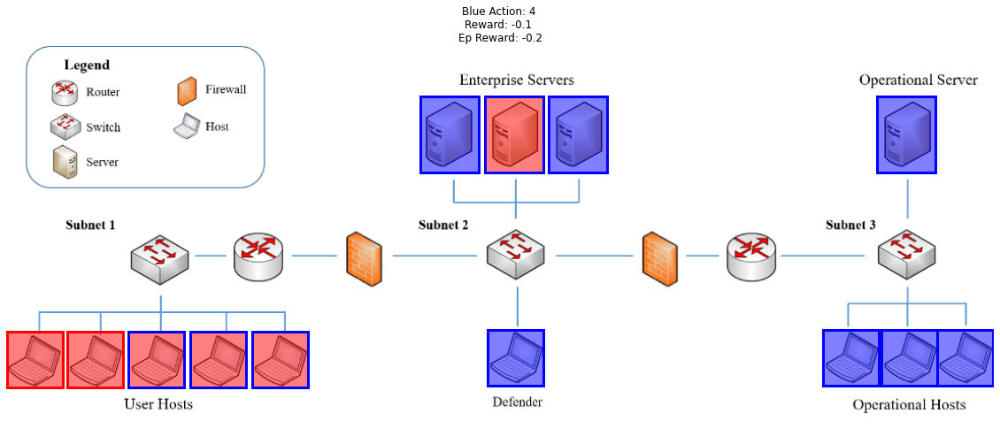

...

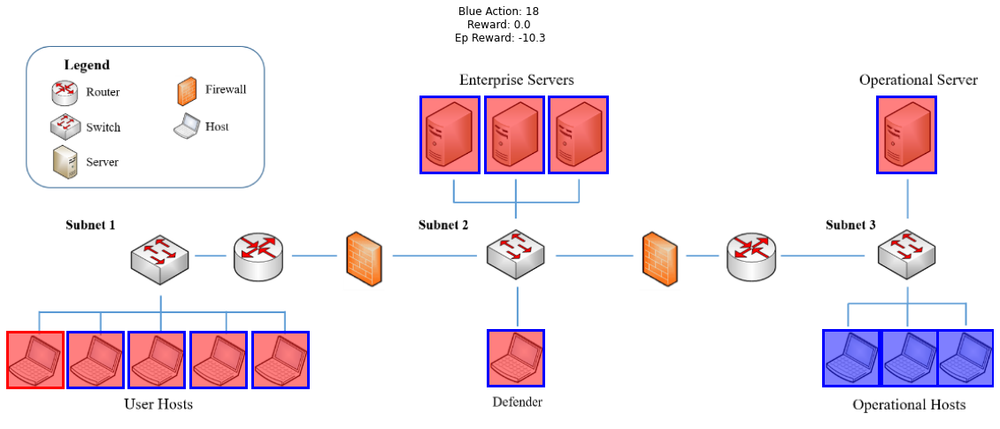

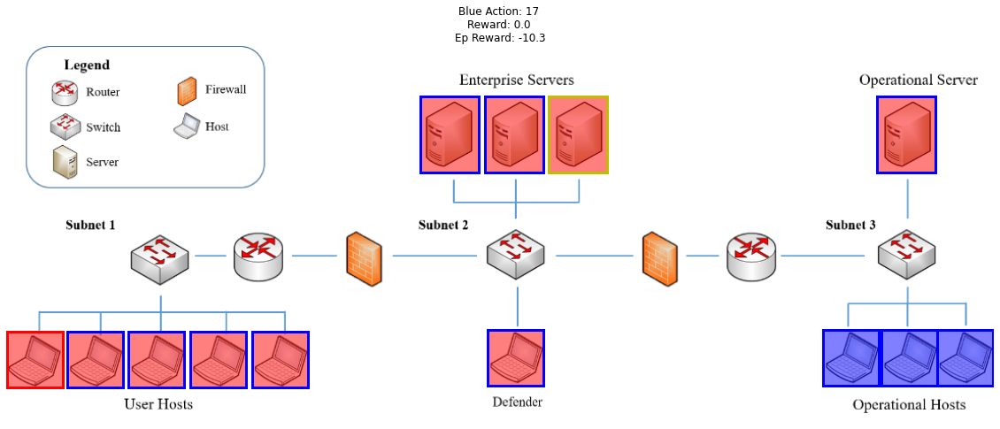

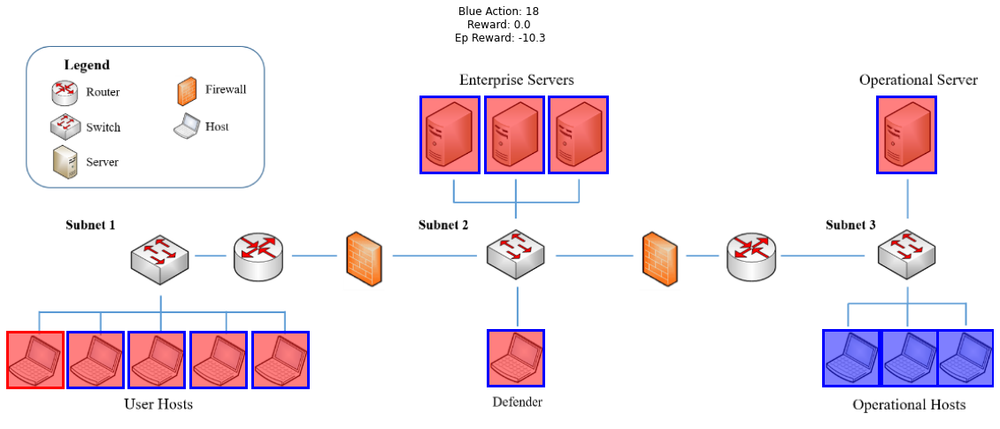

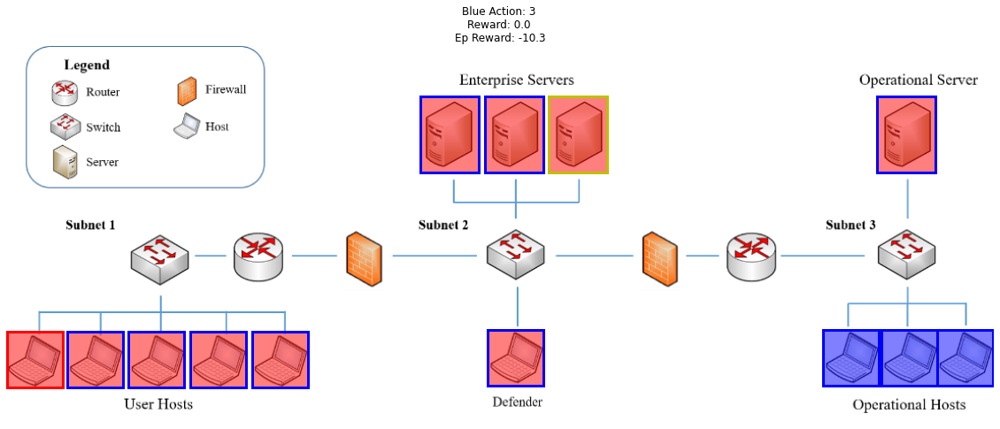

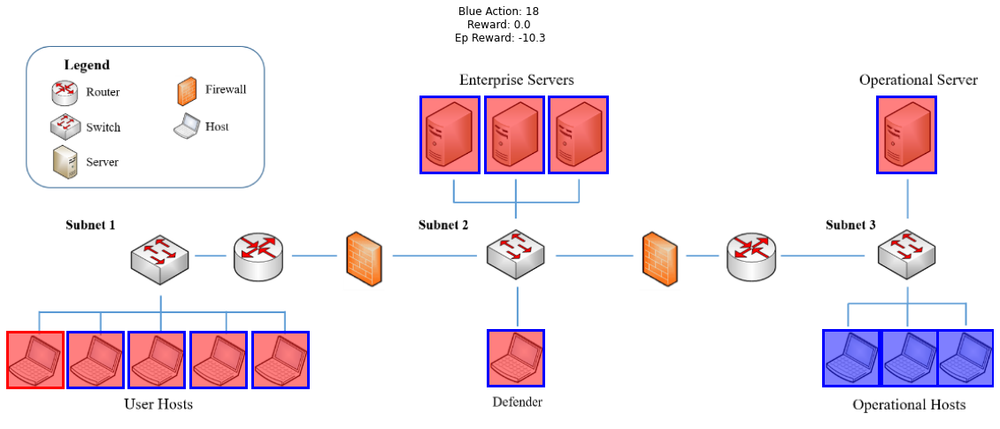

In [22]:
for i in range(len(results_json)):
    img = results_json[i]
    base = Image.open('./img/figure1.png')
    # Create figure and axes
    fig, ax = plt.subplots(figsize=(20, 8))
    # Display the image
    ax.imshow(base)

    for host in img["hosts"]:
    #     def add_patch(hostname, known_state, access_state, scanned=False):
#         print(host)
        add_patch(host["hostname"], host["known"], host["access"], host["scanned"])
    if i == 0:
        plt.title("Starting...")
    else:
        plt.title(f"Blue Action: {img['blue_action']} \nReward: {img['reward']} \nEp Reward: {img['ep_reward']}")
    plt.axis('off')
    plt.savefig(f"./img/img{i}.png")
    plt.show()

# Make a GIF

In [23]:
import glob

# filepaths
fp_in = "img/img*.png"
fp_out = "checkpoint-1000-results.gif"

# https://pillow.readthedocs.io/en/stable/handbook/image-file-formats.html#gif
img, *imgs = [Image.open(f) for f in sorted(glob.glob(fp_in))]
img.save(fp=fp_out, format='GIF', append_images=imgs,
         save_all=True, duration=400, loop=0)